# Unsupervised Learning Capstone

In [1]:
from scipy.stats.mstats import winsorize
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn import ensemble
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sqlalchemy import create_engine
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

## Data Cleaning

In [2]:
data = pd.read_csv("winequalityN.csv") 

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
type                    6497 non-null object
fixed acidity           6487 non-null float64
volatile acidity        6489 non-null float64
citric acid             6494 non-null float64
residual sugar          6495 non-null float64
chlorides               6495 non-null float64
free sulfur dioxide     6497 non-null float64
total sulfur dioxide    6497 non-null float64
density                 6497 non-null float64
pH                      6488 non-null float64
sulphates               6493 non-null float64
alcohol                 6497 non-null float64
quality                 6497 non-null int64
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


## Null Cleaning

In [4]:
Sum = data.isnull().sum()
Percentage = (data.isnull().sum()/data.isnull().count()*100)

pd.concat([Sum,Percentage], axis =1, keys= ['Sum', 'Percentage'])

,Sum,Percentage
type,0,0.000000
fixed acidity,10,0.153917
volatile acidity,8,0.123134
citric acid,3,0.046175
residual sugar,2,0.030783
chlorides,2,0.030783
free sulfur dioxide,0,0.000000
total sulfur dioxide,0,0.000000
density,0,0.000000
pH,9,0.138525


There are quite a few nulls in the data. Let's impute the mean for the continous variables, and impute a placeholder catergory for the categorical variables.

In [5]:
data.fillna(data.mean(), inplace=True)

In [6]:
data.fillna(("None"), inplace=True)

In [7]:
clean_data = data.copy()

Now to check for nulls.

In [8]:
total = clean_data.isnull().sum().sort_values(ascending=False)
percent = (clean_data.isnull().sum()*100/clean_data.isnull().count()).sort_values(ascending = False)
missing_values = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_values.head(20)

,Total,Percent
quality,0,0.0
alcohol,0,0.0
sulphates,0,0.0
pH,0,0.0
density,0,0.0
total sulfur dioxide,0,0.0
free sulfur dioxide,0,0.0
chlorides,0,0.0
residual sugar,0,0.0
citric acid,0,0.0


## Outlier Cleaning

In [9]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

numericsdata = clean_data.select_dtypes(include=numerics)

In [10]:
numericsdata

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.450000,8.8,6
1,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.490000,9.5,6
2,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.440000,10.1,6
3,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.400000,9.9,6
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.400000,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.580000,10.5,5
6493,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.531215,11.2,6
6494,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.750000,11.0,6
6495,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.710000,10.2,5


In [11]:
for variable in numericsdata:
    q75, q25 = np.percentile(clean_data[variable], [75 ,25])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    print("Number of outliers and percentage of it in {} : {} and {}".format(variable,
len((np.where((clean_data[variable] > max_val) | 
(clean_data[variable] < min_val))[0])),len((np.where((clean_data[variable] > max_val) | 
(clean_data[variable] < min_val))[0]))*100/len(clean_data)))

Number of outliers and percentage of it in fixed acidity : 357 and 5.494843774049562
Number of outliers and percentage of it in volatile acidity : 376 and 5.787286439895336
Number of outliers and percentage of it in citric acid : 508 and 7.818993381560721
Number of outliers and percentage of it in residual sugar : 118 and 1.816222872094813
Number of outliers and percentage of it in chlorides : 286 and 4.402031706941665
Number of outliers and percentage of it in free sulfur dioxide : 62 and 0.9542865938125289
Number of outliers and percentage of it in total sulfur dioxide : 10 and 0.1539171925504079
Number of outliers and percentage of it in density : 3 and 0.04617515776512236
Number of outliers and percentage of it in pH : 73 and 1.1235955056179776
Number of outliers and percentage of it in sulphates : 191 and 2.9398183777127906
Number of outliers and percentage of it in alcohol : 3 and 0.04617515776512236
Number of outliers and percentage of it in quality : 228 and 3.5093119901492997


{'whiskers': [<matplotlib.lines.Line2D at 0x25c69617648>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69617d08>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c6960bcc8>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69624f48>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69624ec8>],
 'means': []}

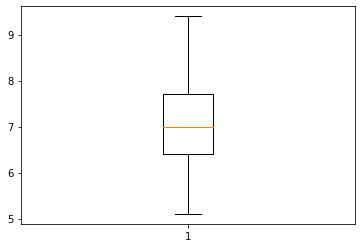

In [12]:
winsorized_FIXEDACIDITY = winsorize(clean_data["fixed acidity"], (0.01, 0.06))
plt.boxplot(winsorized_FIXEDACIDITY)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c696aeb48>,
 'caps': [<matplotlib.lines.Line2D at 0x25c696b3b08>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c696aaf48>],
 'medians': [<matplotlib.lines.Line2D at 0x25c696b7b08>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c696b7bc8>],
 'means': []}

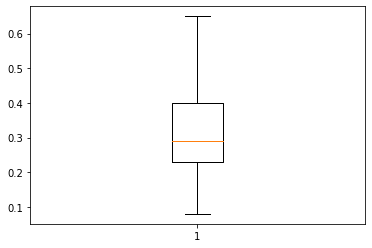

In [13]:
winsorized_VOLACIDITY = winsorize(clean_data["volatile acidity"], (0, 0.06))
plt.boxplot(winsorized_VOLACIDITY)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c6971cf08>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69720f48>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c6971c5c8>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69727fc8>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69727f88>],
 'means': []}

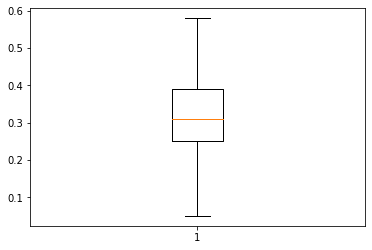

In [14]:
winsorized_CITRICACID = winsorize(clean_data["citric acid"], (0.05, 0.04))
plt.boxplot(winsorized_CITRICACID)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c699cb948>,
 'caps': [<matplotlib.lines.Line2D at 0x25c699d1a88>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c699c8d48>],
 'medians': [<matplotlib.lines.Line2D at 0x25c699d5b88>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c699d5c48>],
 'means': []}

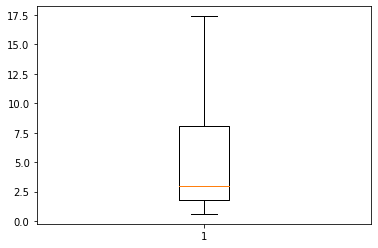

In [15]:
winsorized_RESIDUALSUGAR = winsorize(clean_data["residual sugar"], (0, 0.02))
plt.boxplot(winsorized_RESIDUALSUGAR)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c69a3f308>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69a3fb88>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c69a3c848>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69a43b08>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69a499c8>],
 'means': []}

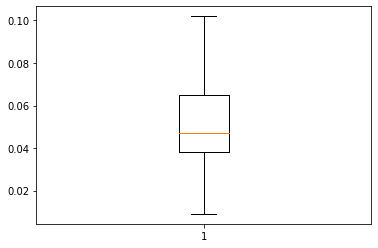

In [16]:
winsorized_CHLORIDES = winsorize(clean_data["chlorides"], (0, 0.05))
plt.boxplot(winsorized_CHLORIDES)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c69aa1ec8>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69aa6fc8>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c69aa1648>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69aa8f88>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69aa8f08>],
 'means': []}

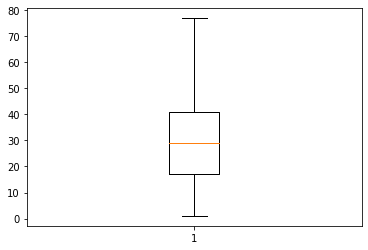

In [17]:
winsorized_FREESULFURDIO = winsorize(clean_data["free sulfur dioxide"], (0, 0.01))
plt.boxplot(winsorized_FREESULFURDIO)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c69b11ec8>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69b13f08>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c69b11588>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69b1aec8>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69b1afc8>],
 'means': []}

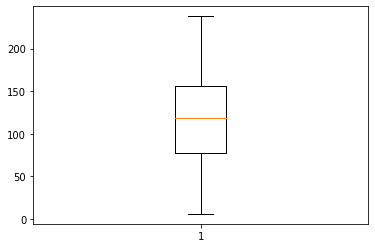

In [18]:
winsorized_TOTSULFURDIO = winsorize(clean_data["total sulfur dioxide"], (0, 0.01))
plt.boxplot(winsorized_TOTSULFURDIO)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c69b77f48>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69b7cac8>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c69b77708>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69b80a48>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69b84908>],
 'means': []}

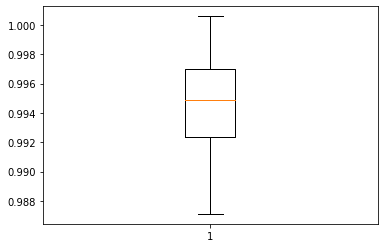

In [19]:
winsorized_DENSITY = winsorize(clean_data["density"], (0, 0.01))
plt.boxplot(winsorized_DENSITY)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c69be3f88>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69be6b08>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c69be3748>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69beaa88>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69bf0948>],
 'means': []}

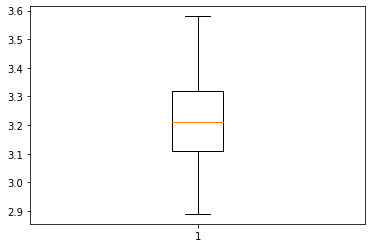

In [20]:
winsorized_pH = winsorize(clean_data["pH"], (0.01, 0.02))
plt.boxplot(winsorized_pH)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c69c51b48>,
 'caps': [<matplotlib.lines.Line2D at 0x25c69c55b08>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c69c4bf48>],
 'medians': [<matplotlib.lines.Line2D at 0x25c69c59a88>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c69c59b48>],
 'means': []}

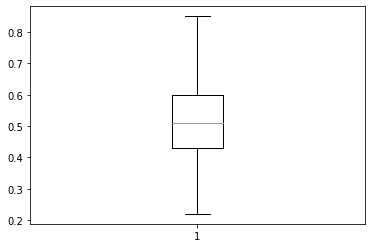

In [21]:
winsorized_SULPHATES = winsorize(clean_data["sulphates"], (0, 0.03))
plt.boxplot(winsorized_SULPHATES)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c6ac8de48>,
 'caps': [<matplotlib.lines.Line2D at 0x25c6ac92e08>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c6ac8d348>],
 'medians': [<matplotlib.lines.Line2D at 0x25c6ac98d88>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c6ac98e48>],
 'means': []}

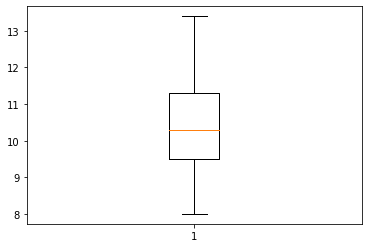

In [22]:
winsorized_ALCOHOL = winsorize(clean_data["alcohol"], (0, 0.01))
plt.boxplot(winsorized_ALCOHOL)

{'whiskers': [<matplotlib.lines.Line2D at 0x25c69c7ecc8>,
 'caps': [<matplotlib.lines.Line2D at 0x25c6ad0ce08>,
 'boxes': [<matplotlib.lines.Line2D at 0x25c69c7e248>],
 'medians': [<matplotlib.lines.Line2D at 0x25c6ad10f08>],
 'fliers': [<matplotlib.lines.Line2D at 0x25c6ad10fc8>],
 'means': []}

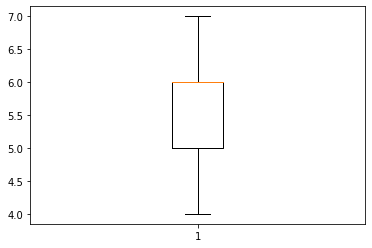

In [23]:
winsorized_QUALITY = winsorize(clean_data["quality"], (0.01, 0.04))
plt.boxplot(winsorized_QUALITY)

In [24]:
winsorized_FIXEDACIDITY = winsorize(clean_data["fixed acidity"], (0.01, 0.06))
winsorized_VOLACIDITY = winsorize(clean_data["volatile acidity"], (0, 0.06))
winsorized_CITRICACID = winsorize(clean_data["citric acid"], (0.05, 0.04))
winsorized_RESIDUALSUGAR = winsorize(clean_data["residual sugar"], (0, 0.02))
winsorized_CHLORIDES = winsorize(clean_data["chlorides"], (0, 0.05))
winsorized_FREESULFURDIO = winsorize(clean_data["free sulfur dioxide"], (0, 0.01))
winsorized_TOTSULFURDIO = winsorize(clean_data["total sulfur dioxide"], (0, 0.01))
winsorized_DENSITY = winsorize(clean_data["density"], (0, 0.01))
winsorized_pH = winsorize(clean_data["pH"], (0.01, 0.02))
winsorized_SULPHATES = winsorize(clean_data["sulphates"], (0, 0.03))
winsorized_ALCOHOL = winsorize(clean_data["alcohol"], (0, 0.01))
winsorized_QUALITY = winsorize(clean_data["quality"], (0.01, 0.04))

In [25]:
clean_data[' winsorized_FIXEDACIDITY'] = winsorized_FIXEDACIDITY 
clean_data['winsorized_VOLACIDITY'] = winsorized_VOLACIDITY 
clean_data['winsorized_CITRICACID'] = winsorized_CITRICACID 
clean_data['winsorized_RESIDUALSUGAR'] = winsorized_RESIDUALSUGAR 
clean_data['winsorized_CHLORIDES'] = winsorized_CHLORIDES 
clean_data['winsorized_FREESULFURDIO'] = winsorized_FREESULFURDIO 
clean_data['winsorized_TOTSULFURDIO'] = winsorized_TOTSULFURDIO 
clean_data['winsorized_DENSITY'] = winsorized_DENSITY
clean_data['winsorized_pH'] = winsorized_pH
clean_data['winsorized_SULPHATES'] = winsorized_SULPHATES
clean_data['winsorized_ALCOHOL'] = winsorized_ALCOHOL
clean_data['winsorized_QUALITY'] = winsorized_QUALITY

In [26]:
clean_data = clean_data.drop(['fixed acidity',
                              'volatile acidity',
                              'citric acid',
                              'residual sugar',
                              'chlorides',
                              'free sulfur dioxide',
                              'total sulfur dioxide',
                              'density',
                              'pH',
                              'sulphates',
                              'alcohol',
                              'quality'], axis=1)

## Data Exploration

In [27]:
clean_data.describe(include='all')

,type,winsorized_FIXEDACIDITY,winsorized_VOLACIDITY,winsorized_CITRICACID,winsorized_RESIDUALSUGAR,winsorized_CHLORIDES,winsorized_FREESULFURDIO,winsorized_TOTSULFURDIO,winsorized_DENSITY,winsorized_pH,winsorized_SULPHATES,winsorized_ALCOHOL,winsorized_QUALITY
count,6497,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
unique,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,white,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,4898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,7.131494,0.332341,0.315978,5.405955,0.053074,30.339541,115.539865,0.994678,3.217113,0.526467,10.488912,5.791750
std,NaN,1.027320,0.143617,0.129128,4.605791,0.020893,16.904806,55.939524,0.002916,0.155033,0.130785,1.184992,0.796123
min,NaN,5.100000,0.080000,0.050000,0.600000,0.009000,1.000000,6.000000,0.987110,2.890000,0.220000,8.000000,4.000000
25%,NaN,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,NaN,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,NaN,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000


In [28]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

numericsdata = clean_data.select_dtypes(include=numerics)

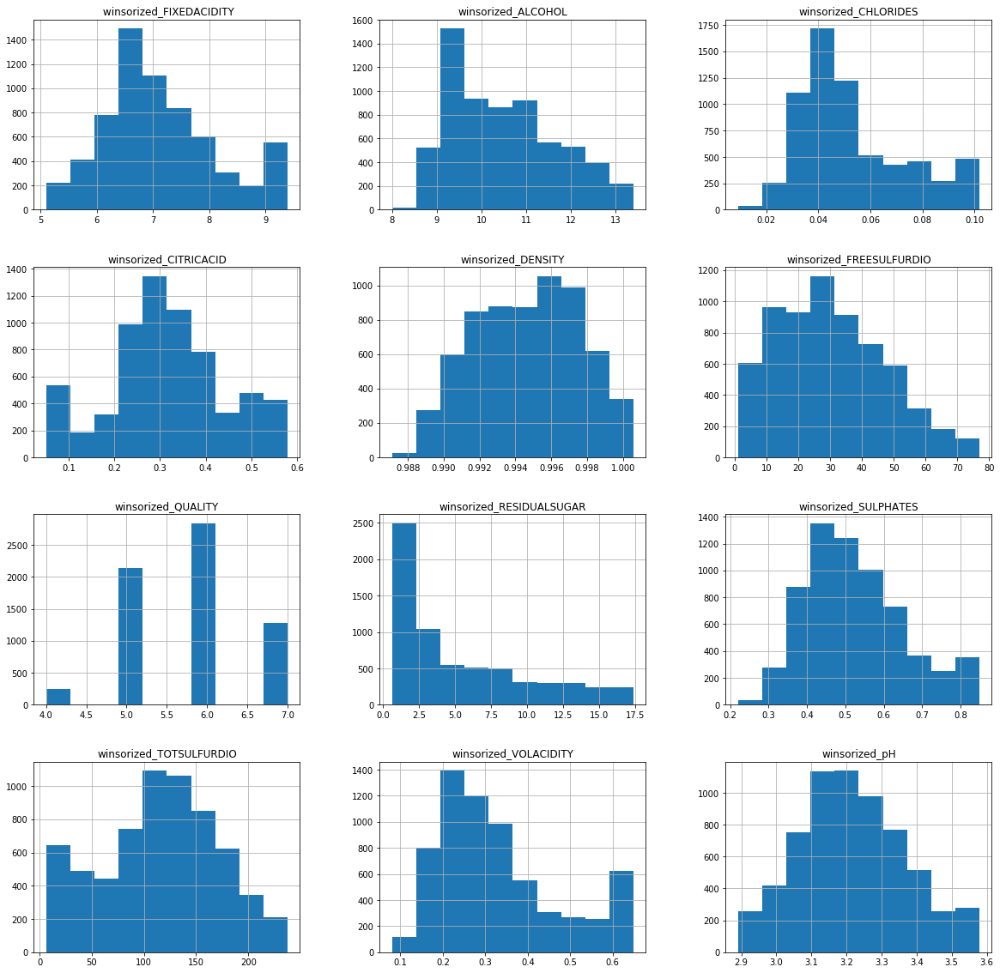

In [29]:
numericsdata.hist(figsize=(20,20))
plt.show()

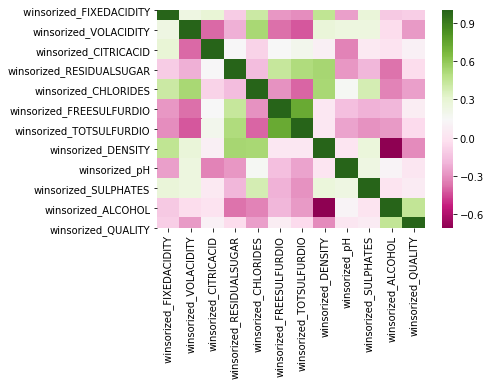

In [30]:
sns.heatmap(numericsdata.corr(), cmap='PiYG')

# Dimensionality reduction

## PCA

In [31]:
X = clean_data.drop(['type'], axis=1)
y = clean_data["type"]

y = np.where(y == 'white', 0, 1)

In [32]:
from sklearn.decomposition import PCA

In [33]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [34]:
pca = PCA(n_components=2)

pca_components = pca.fit_transform(X_std)

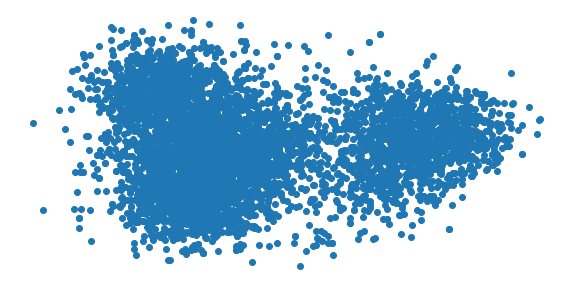

In [35]:
plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

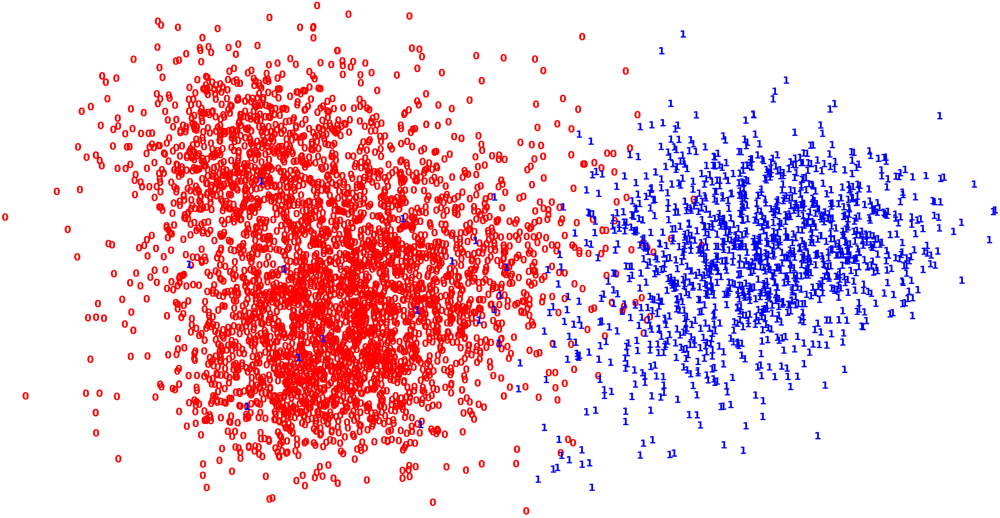

In [36]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

PCA does a good job of showing both classes on two dimensions. Let's try UMAP.

## UMAP

In [37]:
import umap

In [38]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

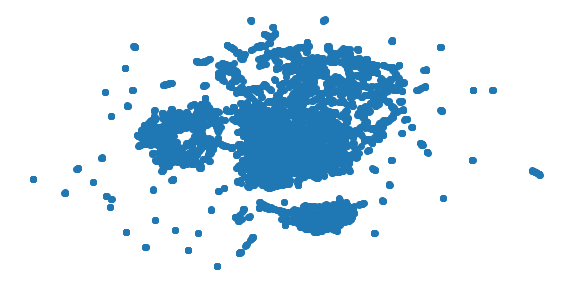

In [39]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [40]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [41]:
umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

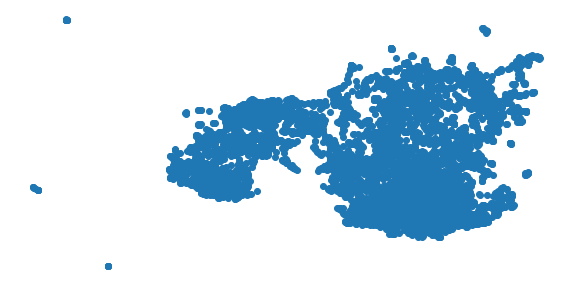

In [42]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [43]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [44]:
umap_results = umap.UMAP(n_neighbors=30,
                      min_dist=0.1,
                      metric='correlation').fit_transform(X_std)

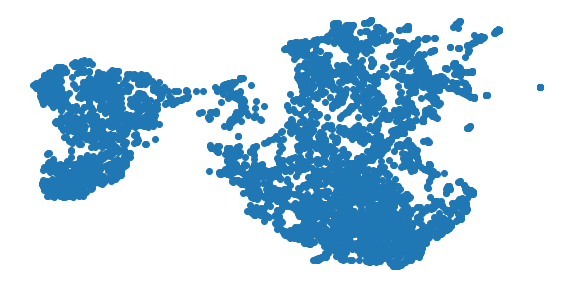

In [45]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

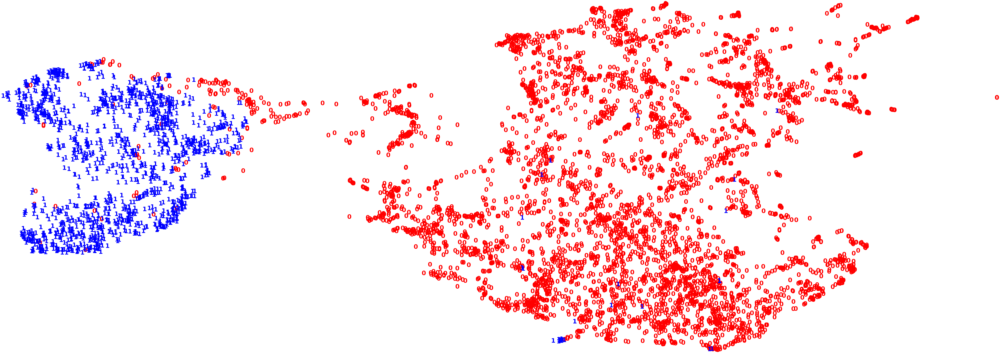

In [46]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [47]:
umap_results = umap.UMAP(n_neighbors=50,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

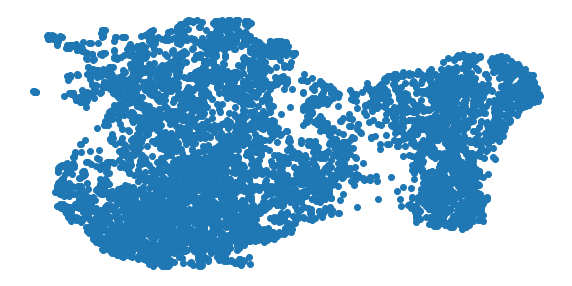

In [48]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

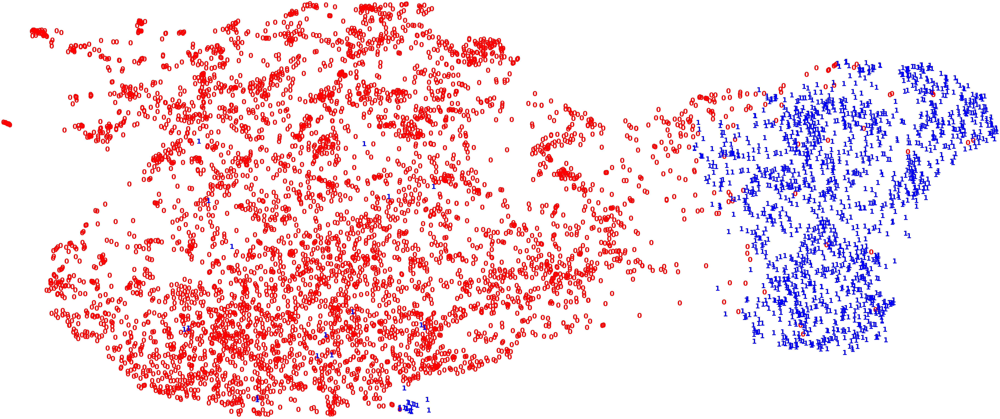

In [49]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [50]:
umap_results = umap.UMAP(n_neighbors=60,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

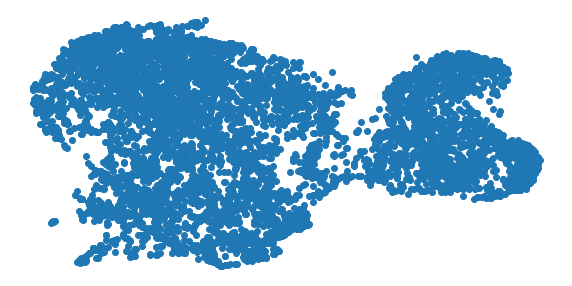

In [51]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

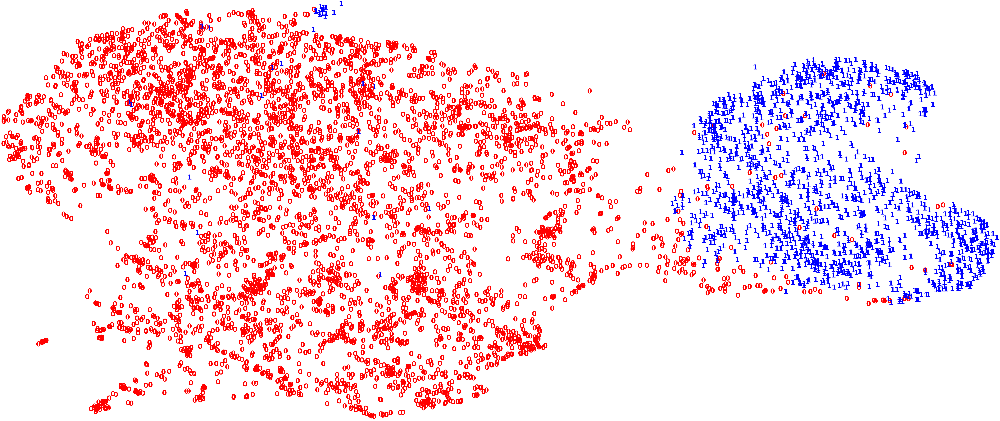

In [52]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

The DBSCAN also clearly shows the two classes clearly. I would prefer using the DBSCAN becaise it shows the small pockets where there are one class in the other more clearly.

## Clustering

To compare the clustering methods, I will compare the Silhouette scores of the methods and choose the highest one.

In [53]:
from sklearn.cluster import KMeans, MiniBatchKMeans

In [54]:
cluster_numbers = [2, 3, 4, 5, 6]
kmeans_clusters = []
for i in cluster_numbers:
    k_means = KMeans(n_clusters=i, random_state=123)
    kmeans_clusters.append(k_means.fit_predict(X_std))

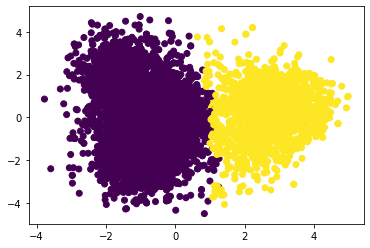

Comparing k-means clusters against the data:
col_0     0     1
row_0            
0      4805    25
1        93  1574


In [55]:
X_pca = PCA(2).fit_transform(X_std)

y_pred = KMeans(n_clusters=2, random_state=123).fit_predict(X_std)

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_pred)
plt.show()

print('Comparing k-means clusters against the data:')
print(pd.crosstab(y_pred, y))

In [56]:
pred_2 = KMeans(n_clusters=2, random_state=123).fit_predict(X_std)
pred_3 = KMeans(n_clusters=3, random_state=123).fit_predict(X_std)
pred_4 = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)

print("ARI for two cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_2)))
print("ARI for three cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_3)))
print("ARI for four cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_4)))

ARI for two cluster k-means: 0.9240208501597792
ARI for three cluster k-means: 0.4308391511139036
ARI for four cluster k-means: 0.3771380376886475


In [57]:
pred_2 = KMeans(n_clusters=2, random_state=123).fit_predict(X_std)
pred_3 = KMeans(n_clusters=3, random_state=123).fit_predict(X_std)
pred_4 = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)

print("Silhouette score for two cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_2, metric='euclidean')))
print("Silhouette score for three cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_3, metric='euclidean')))
print("Silhouette score for four cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_4, metric='euclidean')))

Silhouette score for two cluster k-means: 0.2593104897395555
Silhouette score for three cluster k-means: 0.2297086215098524
Silhouette score for four cluster k-means: 0.22994304342316288


## DBSCAN

In [58]:
from sklearn.cluster import DBSCAN

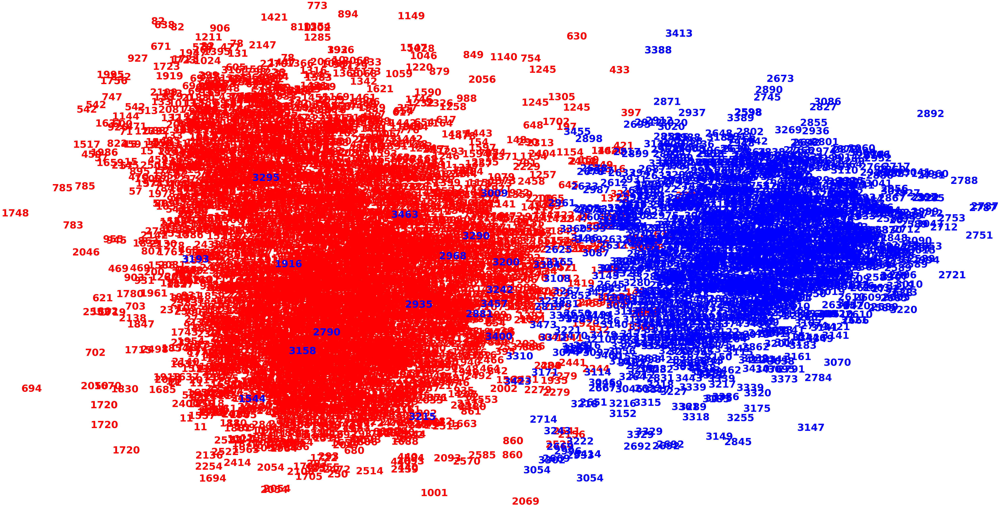

In [59]:
dbscan_cluster = DBSCAN(eps=1, min_samples=1, metric="euclidean")

clusters = dbscan_cluster.fit_predict(X_std)

pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbgrg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [60]:
print("Adjusted Rand Index of the DBSCAN solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))

Adjusted Rand Index of the DBSCAN solution: 0.003981427982184047


In [61]:
print("The silhouette score of the DBSCAN solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution: 0.2471136484611834


## GMM

In [62]:
gmm_cluster = GaussianMixture(n_components=2, random_state=123)

clusters = gmm_cluster.fit_predict(X_std)

print("ARI score: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))

ARI score: 0.794392373586203
Silhouette score: 0.23268854713981546


In [63]:
gmm_cluster = GaussianMixture(n_components=2, random_state=123, covariance_type="full")

clusters = gmm_cluster.fit_predict(X_std)

print("ARI score with covariance_type=full: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score with covariance_type=full: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------------")

gmm_cluster = GaussianMixture(n_components=2, random_state=123, covariance_type="tied")

clusters = gmm_cluster.fit_predict(X_std)

print("ARI score with covariance_type=tied: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score with covariance_type=tied: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------------")

gmm_cluster = GaussianMixture(n_components=2, random_state=123, covariance_type="diag")

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

print("ARI score with covariance_type=diag: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score with covariance_type=diag: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------------")


gmm_cluster = GaussianMixture(n_components=2, random_state=123, covariance_type="spherical")

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

print("ARI score with covariance_type=spherical: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score with covariance_type=spherical: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------------")

ARI score with covariance_type=full: 0.794392373586203
Silhouette score with covariance_type=full: 0.23268854713981546
------------------------------------------------------
ARI score with covariance_type=tied: -0.06063493442984291
Silhouette score with covariance_type=tied: 0.15182316767807544
------------------------------------------------------
ARI score with covariance_type=diag: 0.9192023739027614
Silhouette score with covariance_type=diag: 0.25560214678081616
------------------------------------------------------
ARI score with covariance_type=spherical: -0.0645233943539756
Silhouette score with covariance_type=spherical: 0.15458986625322102
------------------------------------------------------


## Hierarchical clustering

In [64]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

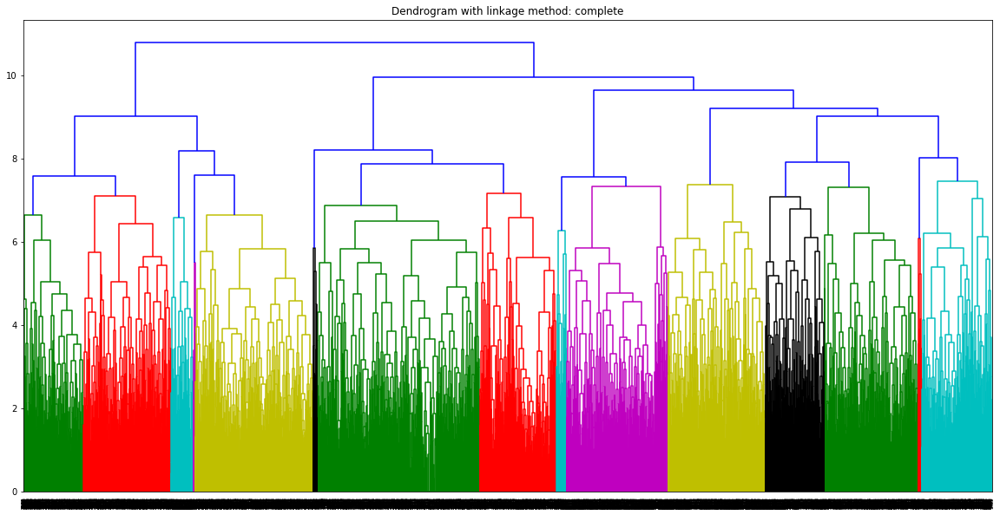

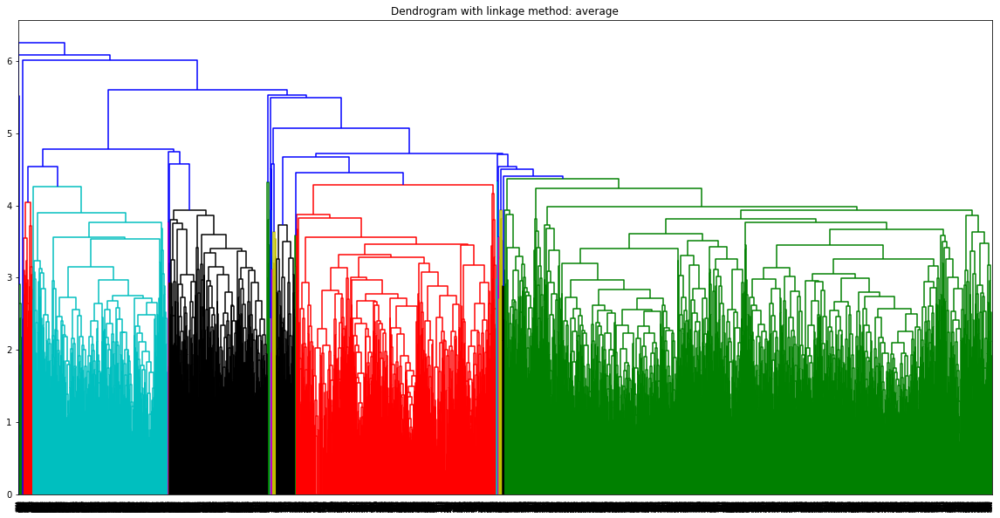

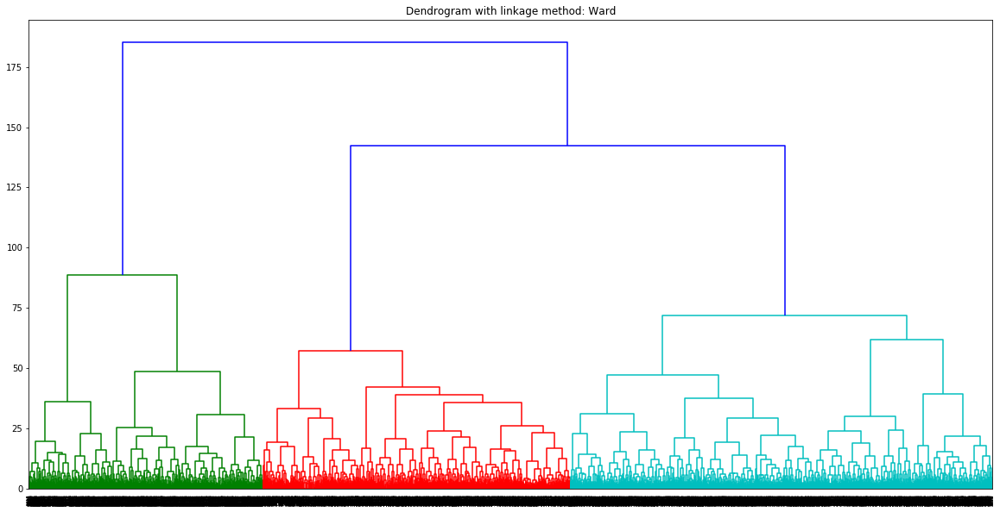

In [65]:
plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: complete")
dendrogram(linkage(X_std, method='complete'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: average")
dendrogram(linkage(X_std, method='average'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: Ward")
dendrogram(linkage(X_std, method='ward'))
plt.show()

In [66]:
linkage_methods = ["ward", "average", "complete"]

agg_cluster = AgglomerativeClustering(linkage="average", 
                                      affinity='cosine',
                                      n_clusters=2)

clusters = agg_cluster.fit_predict(X_std)

print("ARI score of linkage method average: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score of linkage method average: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------")

agg_cluster = AgglomerativeClustering(linkage="complete", 
                                      affinity='cosine',
                                      n_clusters=2)

clusters = agg_cluster.fit_predict(X_std)

print("ARI score of linkage method complete: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score of linkage method complete: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------")

agg_cluster = AgglomerativeClustering(linkage="ward", 
                                      affinity='euclidean',
                                      n_clusters=2)

clusters = agg_cluster.fit_predict(X_std)

print("ARI score of linkage method ward: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score of linkage method ward: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))

ARI score of linkage method average: 0.946570017503171
Silhouette score of linkage method average: 0.2552139646066097
------------------------------------------------
ARI score of linkage method complete: 0.9214244187208576
Silhouette score of linkage method complete: 0.2521099887096097
------------------------------------------------
ARI score of linkage method ward: 0.9548906026051951
Silhouette score of linkage method ward: 0.2568118843979112


The method with the highest Silhouette score is K-Means.

By using clustering, I was able to visually see the differences in classes in my dataset.